In [1]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

In [2]:
import os
import PIL
import PIL.Image
import pathlib


In [3]:
def load_and_preprocess(path):
    
    # adresar s obrazy
    data_dir = pathlib.Path(path)

    # zobrazeni poctu obrazu v adresari
    image_count = len(list(data_dir.glob('*')))
    print(f"Celkem obrazů v adresáři {path}: {image_count}")


    stolen_paintings_paths = list(data_dir.glob('*'))
    stolen_paintings_paths = [str(path) for path in stolen_paintings_paths]
    
    # nacteni vsech obrazu
    paintings = [cv2.imread(painting_path) for painting_path in stolen_paintings_paths]
    paintings_raw = paintings
    
    # konvertovani do rgb
    paintings = [cv2.cvtColor(painting, cv2.COLOR_BGR2RGB) for painting in paintings]
    
    # konvertovani do grayscale
    paintings_gray = [cv2.cvtColor(painting, cv2.COLOR_RGB2GRAY) for painting in paintings]
    
    return paintings, paintings_gray


In [4]:
stolen_art_dir_path = "./test-stolen-set/"
stolen_paintings, stolen_paintings_gray = load_and_preprocess(stolen_art_dir_path)


Celkem obrazů v adresáři ./test-stolen-set/: 6


In [5]:
suspect_paintings_dir_path = "./test-tosearch-set/" 
suspect_paintings,suspect_paintings_gray = load_and_preprocess(suspect_paintings_dir_path)

Celkem obrazů v adresáři ./test-tosearch-set/: 2


In [6]:
def display_compared(img1, img2):
    # Display traning image and testing image
    fx, plots = plt.subplots(1, 2, figsize=(20,10))

    plots[0].set_title("Stolen Image")
    plots[0].imshow(img1)

    plots[1].set_title("Comparing to")
    plots[1].imshow(img2)

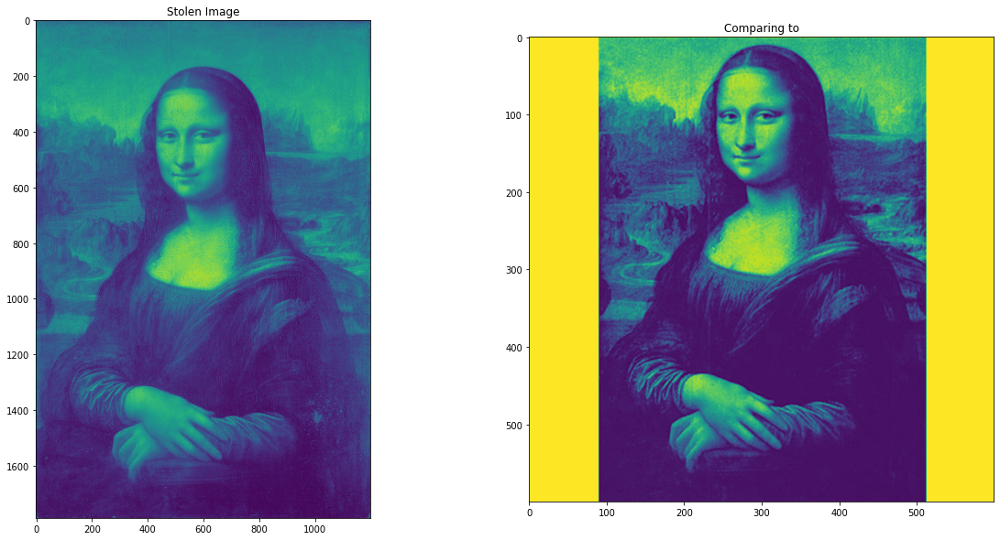

In [7]:
display_compared(stolen_paintings_gray[1], suspect_paintings_gray[0])




In [8]:
orb = cv2.ORB_create(nfeatures=50)
searching_for_image = suspect_paintings[1] 
test_gray = suspect_paintings_gray[1]
test_keypoints, test_descriptor = orb.detectAndCompute(test_gray, None)

# hledany obrazek

Number of Keypoints Detected In The Training Image:  50
Number of Keypoints Detected In The Query Image:  50
Number of Keypoints Detected In The Training Image:  50
Number of Keypoints Detected In The Query Image:  50
Number of Keypoints Detected In The Training Image:  50
Number of Keypoints Detected In The Query Image:  50
Number of Keypoints Detected In The Training Image:  41
Number of Keypoints Detected In The Query Image:  50
Number of Keypoints Detected In The Training Image:  50
Number of Keypoints Detected In The Query Image:  50
Number of Keypoints Detected In The Training Image:  39
Number of Keypoints Detected In The Query Image:  50


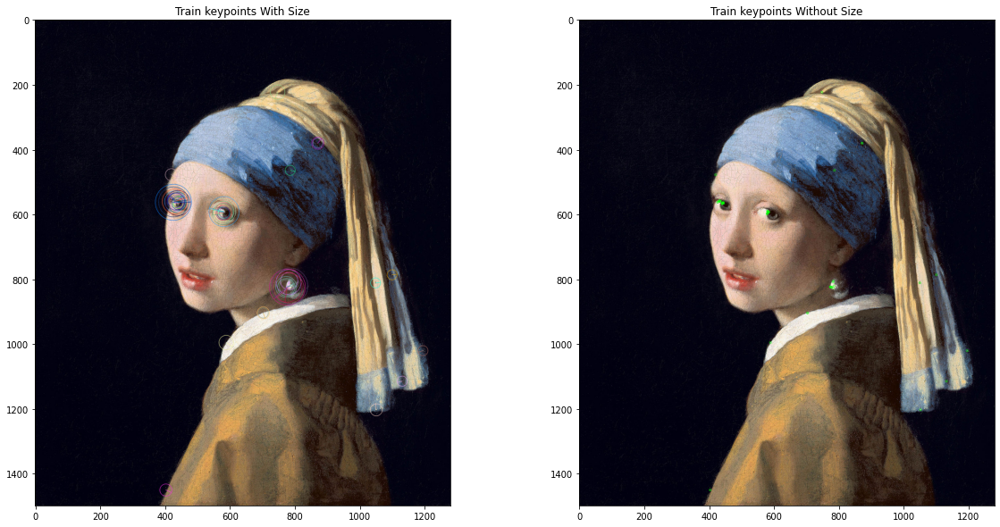

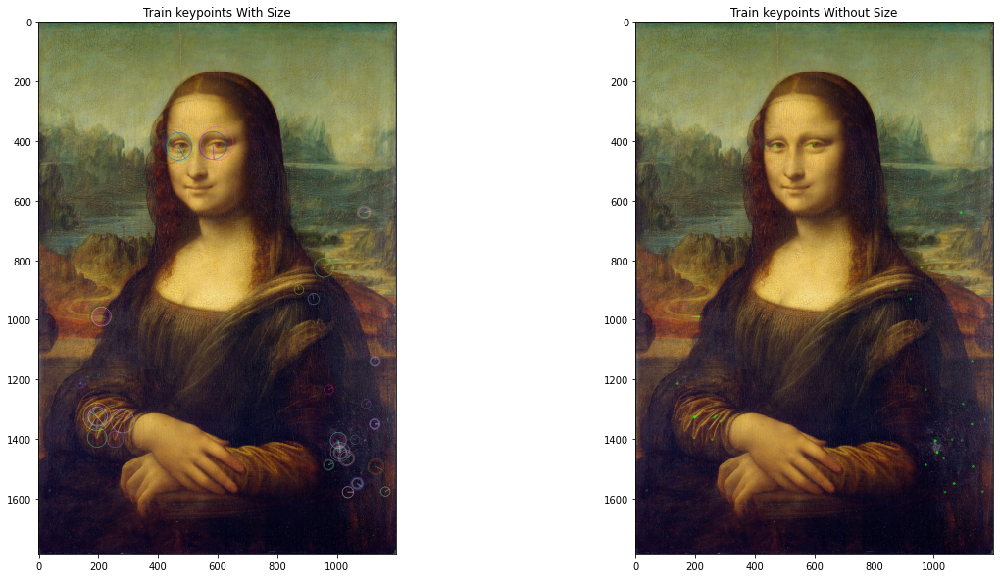

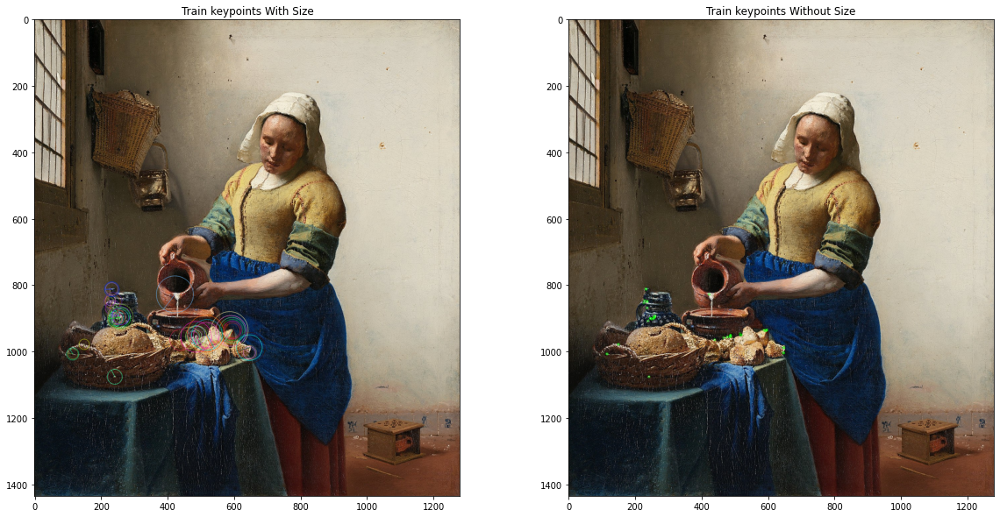

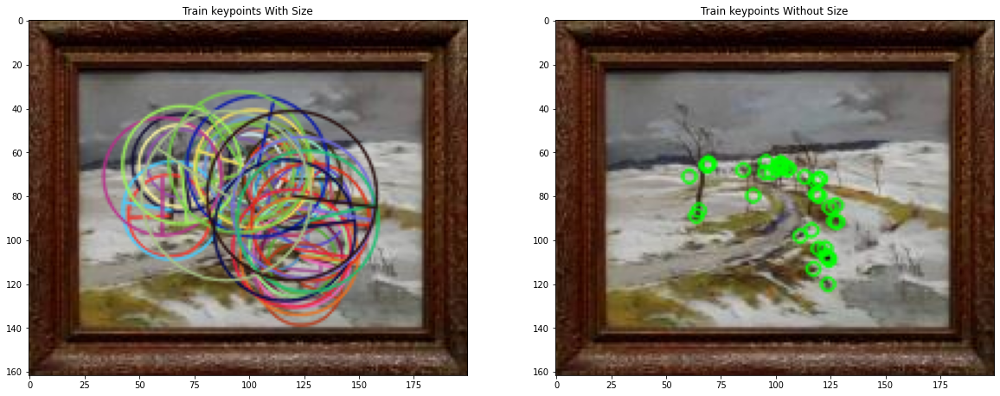

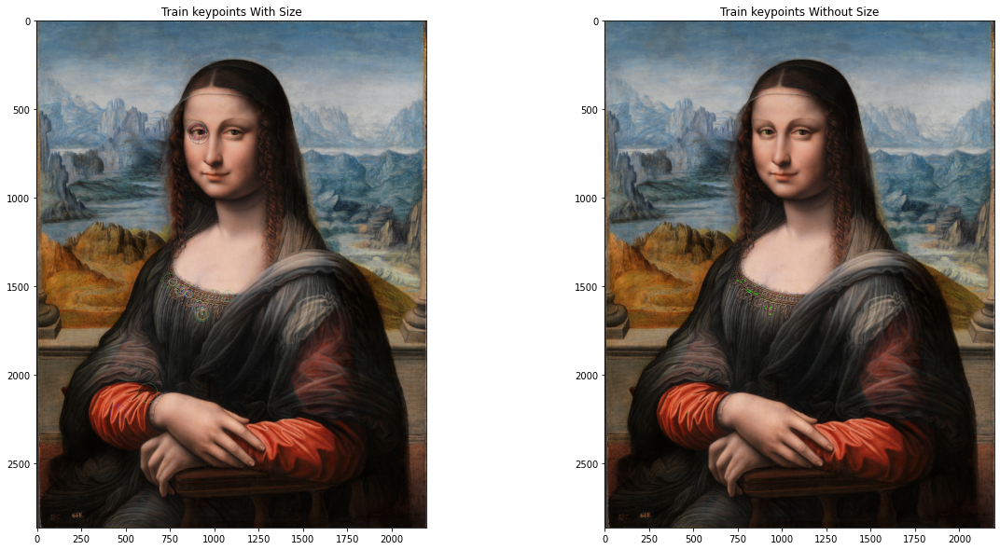

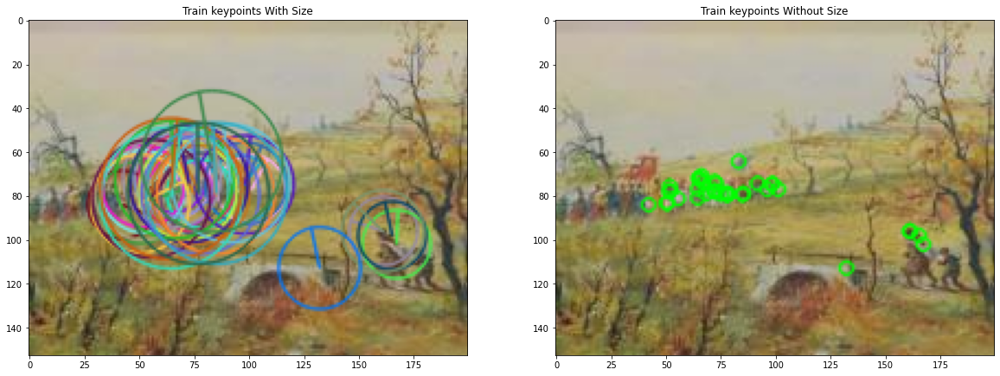

In [9]:
orb_results = []

for index, _ in enumerate(stolen_paintings):

    orb_res = orb.detectAndCompute(stolen_paintings_gray[index], None)
    orb_results.append(orb_res)

    keypoints_without_size = np.copy(stolen_paintings[index])
    keypoints_with_size = np.copy(stolen_paintings[index])

    cv2.drawKeypoints(stolen_paintings[index], orb_res[0], keypoints_without_size, color = (0, 255, 0))

    cv2.drawKeypoints(stolen_paintings[index], orb_res[0], keypoints_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    # Display image with and without keypoints size
    fx, plots = plt.subplots(1, 2, figsize=(20,10))

    plots[0].set_title("Train keypoints With Size")
    plots[0].imshow(keypoints_with_size, cmap='gray')

    plots[1].set_title("Train keypoints Without Size")
    plots[1].imshow(keypoints_without_size, cmap='gray')

    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(orb_res[0]))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(test_keypoints))

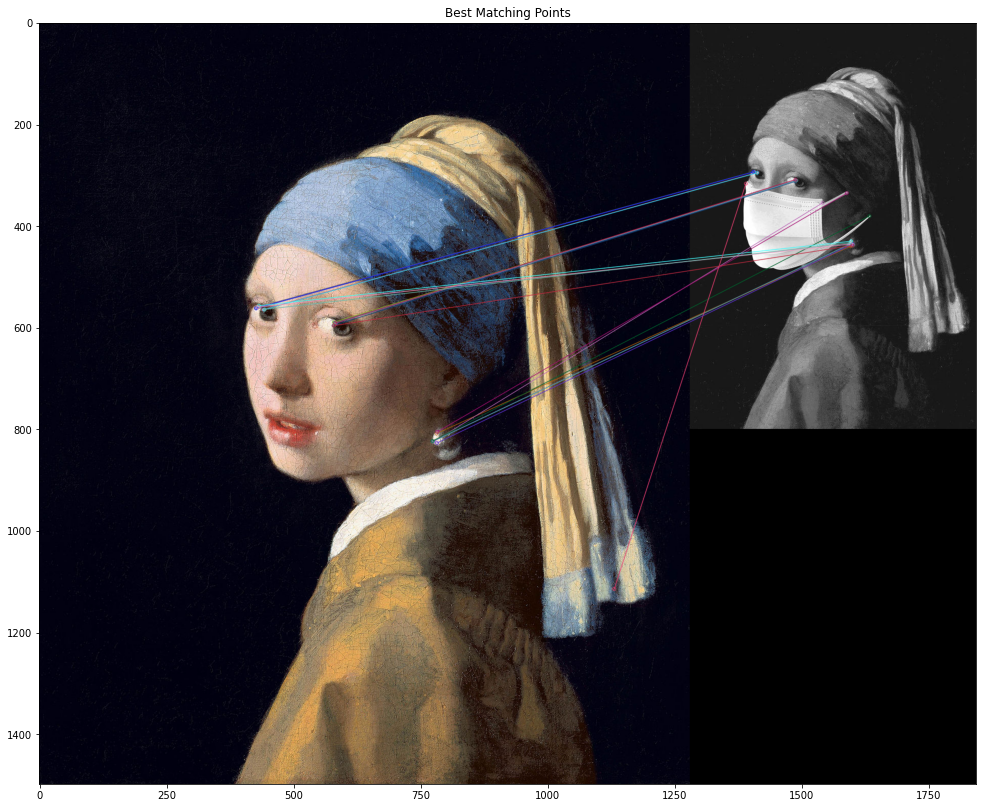


Number of Matching Keypoints Between The Training and Query Images:  22


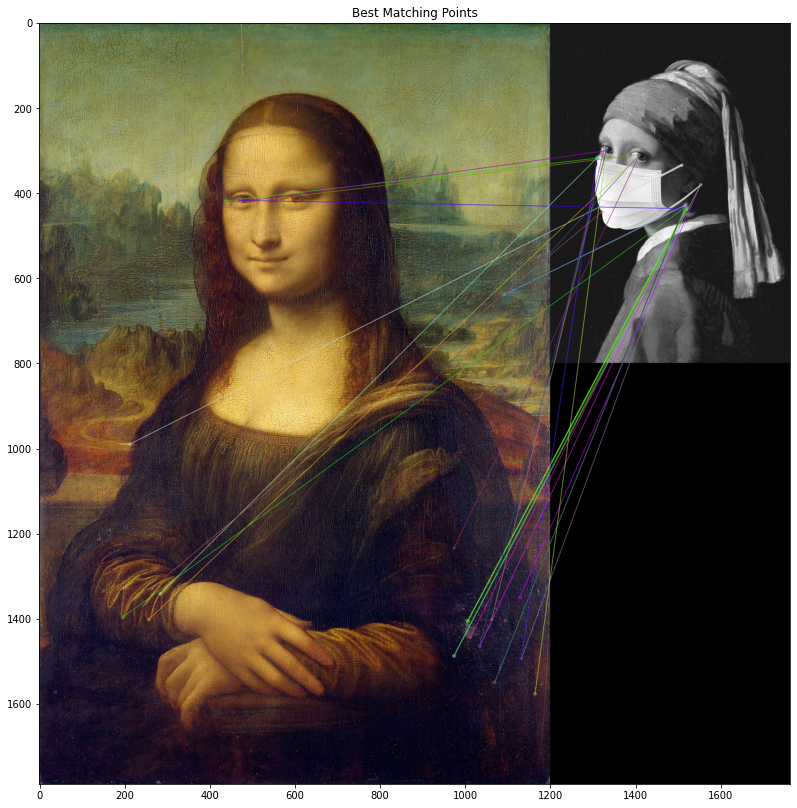


Number of Matching Keypoints Between The Training and Query Images:  29


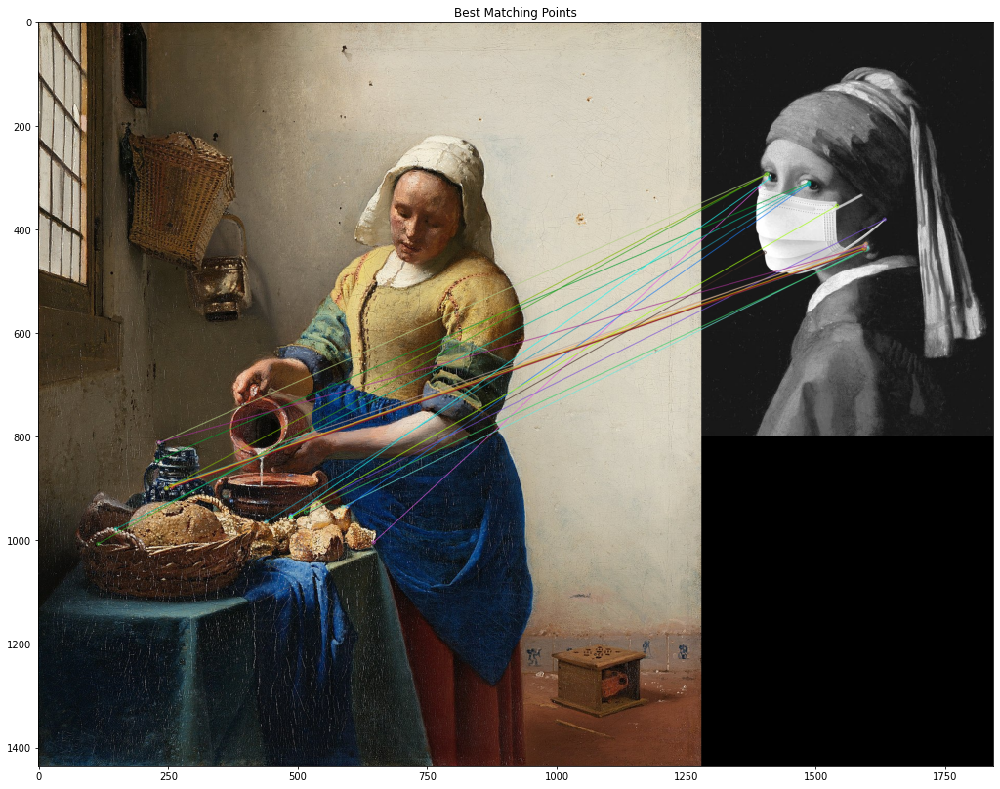


Number of Matching Keypoints Between The Training and Query Images:  21


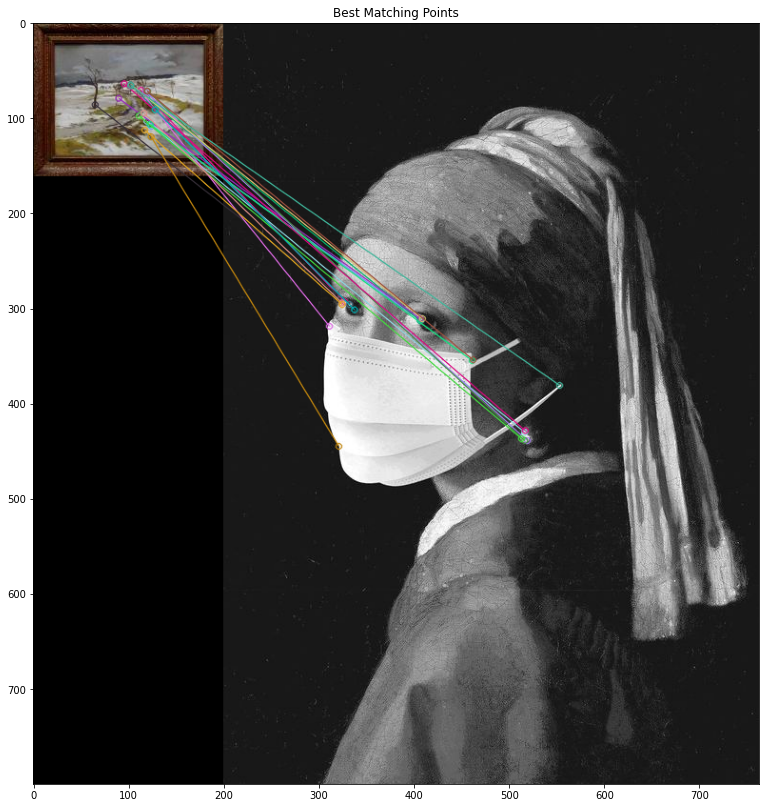


Number of Matching Keypoints Between The Training and Query Images:  20


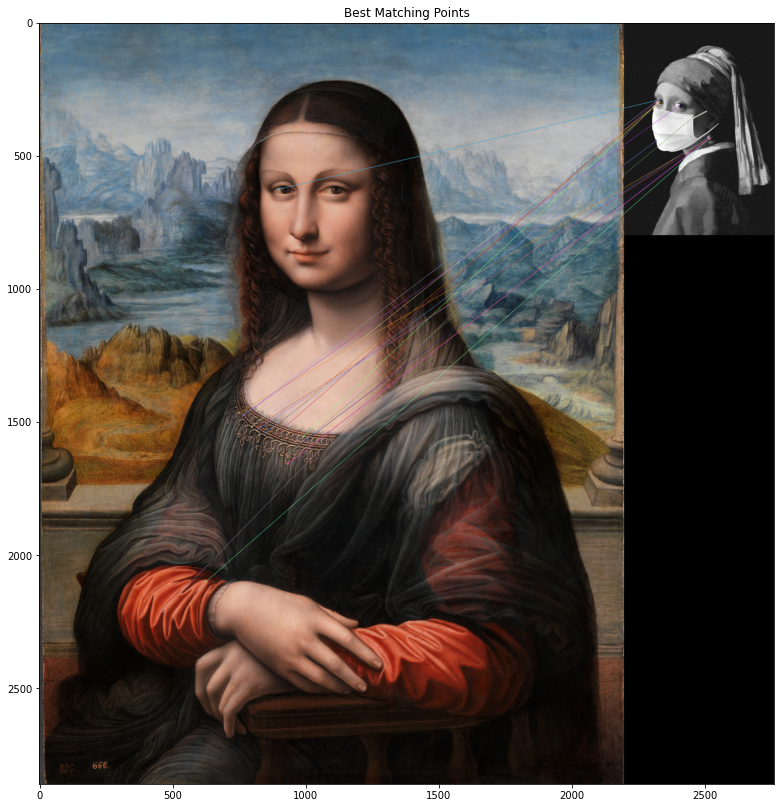


Number of Matching Keypoints Between The Training and Query Images:  18


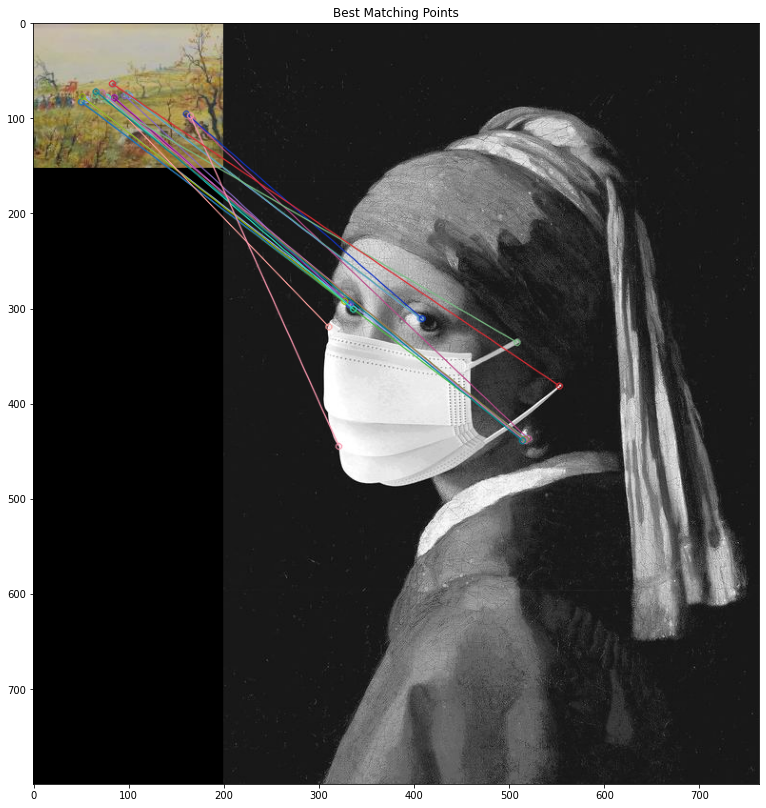


Number of Matching Keypoints Between The Training and Query Images:  19


In [10]:
for index, stolen_res in enumerate(orb_results):
    stolen_keypoints, stolen_descriptor = stolen_res

    # Create a Brute Force Matcher object.
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

        
    
    # Perform the matching between the ORB descriptors of the training image and the test image
    matches = bf.match(stolen_descriptor, test_descriptor)
    # deskriptor = "fingerprint" keypointu, vektor 0 a 1, napr. BRIEF rozmaze misto a z toho spocita vektor
    # ORB muze pouzivat rBRIEF, tzn. pocita i s rotaci obrazu
    
    # The matches with shorter distance are the ones we want.
    matches = sorted(matches, key = lambda x : x.distance)

    result = cv2.drawMatches(stolen_paintings[index], stolen_keypoints, test_gray, test_keypoints, matches, test_gray, flags = 2)
    
    # Display the best matching points
    plt.rcParams['figure.figsize'] = [28.0, 14.0]
    plt.title('Best Matching Points')
    plt.imshow(result)
    plt.show()

    # Print total number of matching points between the training and query images
    print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))